In [5]:
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms,utils
import pickle
from skimage.filters.rank import entropy
from skimage.morphology import disk
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier

In [13]:
class data_loader():
    def __init__(self,img_root,data_List,size = 224, scale = 0):
        self.img_root = img_root
        self.data_List = data_List
        self.size = size
        self.scale = scale
        self.img = self.generate_DataSet(self.data_List, self.img_root)
    def resize_img(self,im,ratio):
        H = im.size[0]
        W = im.size[1]
        return im.resize(( int(H*ratio),int(W*ratio)),resample = Image.LANCZOS )
    def getRandomPair(self,dist, num):
        X_coos = np.arange(dist.shape[0])
        Y_coos = np.arange(dist.shape[1])

        X_prob = np.sum(dist,axis = 1)

        selected_X = np.random.choice(X_coos, size = num, p = X_prob )

        y_probs = dist[selected_X].transpose()/X_prob[selected_X]

        selected_Y = np.zeros_like(selected_X)

        for i,x_s in enumerate(selected_X):
            selected_Y[i] = np.random.choice(Y_coos, size = 1, p = y_probs[:,i] )
        return np.array( [selected_X, selected_Y] )
    def getrealRandomPair(self,dist,num):
        X_coos = np.arange(dist.shape[0])
        Y_coos = np.arange(dist.shape[1])
        selected_X = np.random.choice(X_coos, size = num )
        selected_Y = np.random.choice(Y_coos, size = num )

        return np.array( [selected_X, selected_Y] )
    def mask2distribution(self,mask,order):
        dist = mask - np.min(mask)
        dist = dist/np.sum(dist)
        dist = dist**order
        dist = dist/np.sum(dist)
        return dist
    def get_crop_center(self,mask,number,order,plot=False):
        dist = self.mask2distribution(1-mask,order)
        label_pos = self.getRandomPair(dist,number)
        if plot:
            plt.rcParams['figure.figsize'] = (10,10)
            plt.imshow(dist , cmap='gray')
            for i in range(label_pos.shape[1]):
                red_dot, = plt.plot(label_pos[1,i],label_pos[0,i], "ro", markersize=10)
            plt.show()
        return label_pos
    def get_random_crop_center(self,mask,number,order,plot=False):
        dist = mask
        label_pos = self.getrealRandomPair(dist,number)
        if plot:
            plt.rcParams['figure.figsize'] = (10,10)
            plt.imshow(dist , cmap='gray')
            for i in range(label_pos.shape[1]):
                red_dot, = plt.plot(label_pos[1,i],label_pos[0,i], "ro", markersize=10)
            plt.show()
        return label_pos
    def generate_DataSet(self,data_List, img_root):
        imgCount = 0
        labelDict = dict()
        imgDict = dict()
        with open(data_List) as filer:
            for line in filer.readlines():
                splits = line.strip().split()
                img_name=splits[0]
                label = int(splits[1])
                if label not in labelDict:
                    labelDict[label] = list()
                labelDict[label].append(img_name)
                imgCount += 1
        print('Total images:', imgCount)

        for i in labelDict.keys():
            label = int(i)
            # print(label)
            imgList = labelDict[i]
            for imgPath in imgList:
                img = self.read_img(img_root, imgPath)
                if label not in imgDict:
                    imgDict[label] = dict()
                imgDict[label][imgPath]= img
        return imgDict
    def read_img(self,path,img_name):
        img = dict()
        img=Image.open(path+"/"+img_name)
        if self.scale > 0:
            avgdim = np.average(img.size)
            rt = self.scale/avgdim*3000
            img = self.resize_img(img,rt)
        img_np=np.array(img)
        img_3=img_np[:,:,:3]
        return img_3
    def get_dataset_sequential_cropped(self,size):
        raw_img = self.img
        dataset = dict()
        for cls in raw_img:
            dataset[cls] = dict()
            for name in raw_img[cls]:
                    dataset[cls][name] = self.sequential_crop_and_resize(raw_img[cls][name], size)
        return dataset
    def get_dataset_entropy_random_cropped(self,size,window,order,number,load):
        raw_img = self.img
        dataset = dict()
        for cls in raw_img:
            dataset[cls] = dict()
            for name in raw_img[cls]:
                    dataset[cls][name] = self.entropy_random_crop_and_resize(raw_img[cls][name],name,size,window,order,number,load)
        return dataset
    def get_dataset_random_cropped(self,size,window,order,number,load):
        raw_img = self.img
        dataset = dict()
        for cls in raw_img:
            dataset[cls] = dict()
            for name in raw_img[cls]:
                    dataset[cls][name] = self.random_crop_and_resize(raw_img[cls][name],name,size,window,order,number,load)
        return dataset
    def sequential_crop_and_resize(self,im,size):
        im_np = np.array( im )
        H = im_np.shape[0]
        W = im_np.shape[1]
        num_H = H//size
        num_W = W//size
        skip_H = (H-num_H*size)//2
        skip_W = (W-num_W*size)//2
        im_np_2 = im_np[skip_H:skip_H+num_H*size,skip_W:skip_W+num_W*size,:].reshape(num_H,size,num_W,size,im_np.shape[-1]).transpose((0,2,1,3,4)).reshape(-1,size,size,im_np.shape[-1])
        im_np_1 = im_np[0:num_H*size,0:num_W*size,:].reshape(num_H,size,num_W,size,im_np.shape[-1]).transpose((0,2,1,3,4)).reshape(-1,size,size,im_np.shape[-1])
        im_np = np.stack( (im_np_1,im_np_2)).reshape(-1,size,size,im_np.shape[-1])
        #print( im_np.shape )
        return im_np
    def entropy_random_crop_and_resize(self,im,imname,size,window,order,number,load):
        path = self.img_root
        if os.path.exists(path+"/"+imname+"_"+str(self.scale)+"_mask.npy") and load:
            mask=np.load(path+"/"+imname+"_"+str(self.scale)+"_mask.npy")
        else:
            mask = 1-entropy( np.array( Image.fromarray(im).convert("L") ), disk(window))
            np.save(path+"/"+imname+"_"+str(self.scale)+"_mask.npy",mask)
        crps = self.get_crop_center(mask,number,order,plot=True)
        
        im_np = np.array( im )
        H = im_np.shape[0]
        W = im_np.shape[1]
        crops = []
        for i in range(crps.shape[1]):
            #print(crps[:,i])
            start_pt = crps[:,i] - size//2
            end_pt = start_pt+size
            # 
            left_fix = np.abs( np.minimum( start_pt, 0 ) )
            start_pt += left_fix 
            end_pt += left_fix 
            right_fix = np.abs( np.minimum( np.array([H,W])-end_pt,0 ) )
            start_pt -= right_fix
            end_pt -= right_fix

            #print(start_pt)

            crops.append( im_np[start_pt[0]:end_pt[0], start_pt[1]:end_pt[1]] )
    
        return np.array(crops)
    
    def random_crop_and_resize(self,im,imname,size,window,order,number,load):
        path = self.img_root
        im_np = np.array( im )
        mask = np.zeros_like( im_np ) 
        crps = self.get_random_crop_center(mask,number,order,plot=True)
        
        
        H = im_np.shape[0]
        W = im_np.shape[1]
        crops = []
        for i in range(crps.shape[1]):
            #print(crps[:,i])
            start_pt = crps[:,i] - size//2
            end_pt = start_pt+size
            # 
            left_fix = np.abs( np.minimum( start_pt, 0 ) )
            start_pt += left_fix 
            end_pt += left_fix 
            right_fix = np.abs( np.minimum( np.array([H,W])-end_pt,0 ) )
            start_pt -= right_fix
            end_pt -= right_fix

            #print(start_pt)

            crops.append( im_np[start_pt[0]:end_pt[0], start_pt[1]:end_pt[1]] )
    
        return np.array(crops)
        
    def get_data_ready(self,crop_type,window = 150, order = 3, number = 100,load = True):
        if crop_type == "sequential":
            dataset = self.get_dataset_sequential_cropped(self.size)
        elif crop_type == "entropy_random":
            dataset = self.get_dataset_entropy_random_cropped(self.size, window, order, number, load = load)
        elif crop_type == "random":
            dataset = self.get_dataset_random_cropped(self.size, window, order, number, load = load)
        classes = list(dataset.keys())
        i = 0
        for cls in classes:
            img_names = list(dataset[cls].keys())
            for img in img_names:
                if i == 0:
                    chunk = dataset[cls][img]
                    group = np.repeat(int(img.split(".")[0]),chunk.shape[0])
                    label = np.repeat(cls,chunk.shape[0])
                else:
                    num_chunk = dataset[cls][img].shape[0]
                    chunk = np.concatenate( (chunk,dataset[cls][img]),axis = 0 )
                    group = np.concatenate( (group,np.repeat(int(img.split(".")[0]),num_chunk) ),axis = 0 )
                    label = np.concatenate( (label,np.repeat(cls,num_chunk) ),axis = 0 )
                i+=1

        return chunk,label.astype(int),group
    
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    #mean = np.array([0.485, 0.456, 0.406])
    #std = np.array([0.229, 0.224, 0.225])
    #inp = std * inp + mean
    #inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated



In [73]:
loader = data_loader(img_root,data_List,size = 224,scale = 0)
X,y,group = loader.get_data_ready("sequential")
#X,y,group = loader.get_data_ready("entropy_random")

Total images: 21


In [ ]:
img_root='/Users/scraed/Downloads/data+label/TrainData'
data_List='/Users/scraed/Downloads/data+label/label.txt'
for num in [100,200,400,800,1600]:
    for scale in [1,0.5,0.25,0.125]:
        for extract_type in ["random","entropy_random"]: 
            loader = data_loader(img_root,data_List,size = 224,scale = scale)
            X,y,group = loader.get_data_ready(extract_type,window = int( 150*scale ),number = num,load = True)
            np.savez(img_root+"/"+str(scale)+'_'+extract_type+"_"+str(num)+".npz", X = X, y = y, group = group )
            print( "exported: " + img_root+"/"+str(scale)+'_'+extract_type+"_"+str(num)+".npz"  )

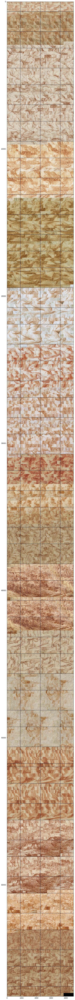

In [76]:
plt.rcParams['figure.figsize'] = (20,120)
out = torchvision.utils.make_grid( torch.from_numpy(X[filt].transpose(0,3,1,2)),nrow = 20 )
imshow(out)